### import

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import scipy.misc as misc
import os, time

### parameters

In [2]:
BATCH_SIZE = 2
IMAGE_H = 256
IMAGE_W = 256

CONTENT_WEIGHT = 5
STYLE_WEIGHT = 20
TV_WEIGHT = 1e-5

COCO_PATH = '/home/minsisi/COCO_DATASET/train2014/'
DATA_NUM = 10000
EPOCH = 1
LR = 1e-3

STYLE_NUM = 4
STYLE_PATH = "style_images"

### new function for multi style transfer

In [3]:
def mirror_padding(img, kernel):
    n = img.get_shape().as_list()[2] # Height of image
    
    pad_size = (kernel-1)/2
    
    a=b=pad_size
    
    paddings = np.array([[0,0], [a,a], [b,b],[0,0]] ,dtype=np.int32)
    
    return tf.pad(img, paddings, mode="SYMMETRIC",name='pad')
            

In [4]:
def instance_norm(x,sty_factor, epsilon=1e-3):
    mu, sig_sq = tf.nn.moments(x,axes=[1,2],  keep_dims=True)
    ch = x.get_shape().as_list()[-1] 
    
    #
    scales = tf.Variable(tf.ones(shape=[STYLE_NUM, ch]))
    offsets = tf.Variable(tf.zeros(shape=[STYLE_NUM, ch]))  

    # 
    gamma = tf.reduce_sum(tf.multiply(scales,sty_factor), 0)
    beta = tf.reduce_sum(tf.multiply(offsets,sty_factor), 0)
    
    return ((x-mu)/tf.sqrt(sig_sq+epsilon))*gamma + beta

In [5]:
def upsampling_block(inp, st, kn,ch, sty_factor,relu=True, pad='zero'):
    inp_ch = inp.get_shape()[3].value
    w = weight_tensor([kn, kn, inp_ch, ch])
    inp_shape = inp.get_shape().as_list()
    ## image resize by nearest neighbor
    new_size = [int(inp_shape[1]*2), int(inp_shape[2]*2)]
    inp = tf.image.resize_images(inp, new_size,method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    ## convolution
    if pad == 'zero':
        padding = 'SAME'
    elif pad == 'mirror':
        inp = mirror_padding(inp, kn)
        padding = 'VALID'
        
    h = tf.nn.conv2d(inp,w, strides=[1, st, st, 1], padding=padding)

    # instance norm
    h = instance_norm(h,sty_factor)
    
    ## relu
    if relu:
        h = tf.nn.relu(h)
        
    return h

In [6]:
def conv_block(inp, st, kn, ch, sty_factor, relu=True, pad ='zero'):
    inp_ch = inp.get_shape()[3].value
    w = weight_tensor([kn, kn, inp_ch, ch])
    
    ## convolution
    if pad == 'zero':
        padding = 'SAME'
    elif pad == 'mirror':
        inp = mirror_padding(inp, kn)
        padding = 'VALID'
        
    h = tf.nn.conv2d(inp,w, strides=[1, st, st, 1], padding=padding)
    
    # instance norm
    h = instance_norm(h,sty_factor)
    
    ## relu
    if relu:
        h = tf.nn.relu(h)
        
    return h


In [7]:
# transform net func
def weight_tensor(shape):
    return tf.Variable(tf.truncated_normal(shape,stddev=0.1))

def bias_tensor(shape):
    return tf.Variable(tf.zeros(shape))

In [8]:
def residual_blcok(inp, st, kn, ch,sty_factor):
    h = conv_block(inp, st, kn, ch, sty_factor, pad = 'mirror')
    h = conv_block(h, st, kn, ch, sty_factor, relu=False, pad = 'mirror')
    return h+inp

### for image 

In [9]:
# # for image process
def visualize_img(x):
    return np.clip(x, 0, 255).astype('uint8')

def read_img(img_path):
    img = misc.imread(img_path)
    if not (len(img.shape) == 3 and img.shape[2] == 3):
        img = np.dstack((img,img,img))
    
    return misc.imresize(img, (IMAGE_H,IMAGE_W,3))


### for vgg net

In [10]:
# for vgg network
def conv2d(x, W):
        return tf.nn.conv2d(x,W, strides=[1, 1, 1, 1], padding='SAME')

def avg_pool_2x2(x):
    return tf.nn.avg_pool(x, ksize=[1, 2, 2, 1],
                        strides=[1, 2, 2, 1], padding='SAME')

### tensor preprocess

In [11]:
# mean value 
def tf_rev_prosess(out_img):
    return tf.stack([ out_img[:,:,:,0] + 103.939, out_img[:,:,:,1] + 116.779,out_img[:,:,:,2] + 123.68], axis=3)

def tf_preprocess(out_img):
    return tf.stack([ out_img[:,:,:,0] - 103.939, out_img[:,:,:,1] - 116.779,out_img[:,:,:,2] - 123.68 ], axis=3)

### transform net

In [12]:
# style factor
sty_factors = tf.placeholder(shape=[STYLE_NUM,1], dtype=tf.float32)

# transform net
inp_imgs = tf.placeholder(shape=[None, IMAGE_H, IMAGE_W, 3], dtype= tf.float32) # order BGR, subtracted means
trans_inp = inp_imgs/255

# conv
conv1 = conv_block(trans_inp, 1, 9, 32, sty_factors, pad = 'mirror')
conv2 = conv_block(conv1, 2, 3, 64, sty_factors, pad = 'mirror')
conv3 = conv_block(conv2, 2, 3, 128, sty_factors, pad = 'mirror')

# residual
rconv1 =  residual_blcok(conv3, 1, 3, 128, sty_factors)
rconv2 =  residual_blcok(rconv1, 1, 3, 128, sty_factors)
rconv3 =  residual_blcok(rconv2, 1, 3, 128, sty_factors)
rconv4 =  residual_blcok(rconv3, 1, 3, 128, sty_factors)
rconv5 =  residual_blcok(rconv4, 1, 3, 128, sty_factors)

# use image resize upsampling
upconv1 = upsampling_block(rconv5, 1, 3, 64, sty_factors, pad='mirror')
upconv2 = upsampling_block(upconv1, 1, 3, 32, sty_factors ,pad='mirror')
dconv3 = conv_block(upconv2, 1, 9, 3, sty_factors, relu=False, pad='mirror')

#
transform_out_img = tf.nn.tanh(dconv3) * 150 + 255./2

### vgg net

In [13]:
# load vgg weights
vggW = np.load('vgg19_weights.npy')
W_CONV1_1 = tf.constant(vggW[0])
b_CONV1_1 = tf.constant(vggW[1])
W_CONV1_2 = tf.constant(vggW[2])
b_CONV1_2 = tf.constant(vggW[3])

W_CONV2_1 = tf.constant(vggW[4])
b_CONV2_1 = tf.constant(vggW[5])
W_CONV2_2 = tf.constant(vggW[6])
b_CONV2_2 = tf.constant(vggW[7])

W_CONV3_1 = tf.constant(vggW[8])
b_CONV3_1 = tf.constant(vggW[9])
W_CONV3_2 = tf.constant(vggW[10])
b_CONV3_2 = tf.constant(vggW[11])
W_CONV3_3 = tf.constant(vggW[12])
b_CONV3_3 = tf.constant(vggW[13])
W_CONV3_4 = tf.constant(vggW[14])
b_CONV3_4 = tf.constant(vggW[15])

W_CONV4_1 = tf.constant(vggW[16])
b_CONV4_1 = tf.constant(vggW[17])
W_CONV4_2 = tf.constant(vggW[18])
b_CONV4_2 = tf.constant(vggW[19])
W_CONV4_3 = tf.constant(vggW[20])
b_CONV4_3 = tf.constant(vggW[21])
W_CONV4_4 = tf.constant(vggW[22])
b_CONV4_4 = tf.constant(vggW[23])

W_CONV5_1 = tf.constant(vggW[24])
b_CONV5_1 = tf.constant(vggW[25])
W_CONV5_2 = tf.constant(vggW[26])
b_CONV5_2 = tf.constant(vggW[27])

del(vggW)

In [14]:
def vgg19(vggx):
    h_conv1_1 = tf.nn.relu(conv2d(vggx, W_CONV1_1) + b_CONV1_1)
    h_conv1_2 = tf.nn.relu(conv2d(h_conv1_1, W_CONV1_2) + b_CONV1_2)
    h_pool1 = avg_pool_2x2(h_conv1_2)

    h_conv2_1 = tf.nn.relu(conv2d(h_pool1,   W_CONV2_1) + b_CONV2_1)
    h_conv2_2 = tf.nn.relu(conv2d(h_conv2_1, W_CONV2_2) + b_CONV2_2)
    h_pool2 = avg_pool_2x2(h_conv2_2)

    h_conv3_1 = tf.nn.relu(conv2d(h_pool2,   W_CONV3_1) + b_CONV3_1)
    h_conv3_2 = tf.nn.relu(conv2d(h_conv3_1, W_CONV3_2) + b_CONV3_2)
    h_conv3_3 = tf.nn.relu(conv2d(h_conv3_2, W_CONV3_3) + b_CONV3_3)
    h_conv3_4 = tf.nn.relu(conv2d(h_conv3_3, W_CONV3_4) + b_CONV3_4)
    h_pool3 = avg_pool_2x2(h_conv3_4)

    h_conv4_1 = tf.nn.relu(conv2d(h_pool3,   W_CONV4_1) + b_CONV4_1)
    h_conv4_2 = tf.nn.relu(conv2d(h_conv4_1, W_CONV4_2) + b_CONV4_2)
    h_conv4_3 = tf.nn.relu(conv2d(h_conv4_2, W_CONV4_3) + b_CONV4_3)
    h_conv4_4 = tf.nn.relu(conv2d(h_conv4_3, W_CONV4_4) + b_CONV4_4)
    h_pool4 = avg_pool_2x2(h_conv4_4)

    h_conv5_1 = tf.nn.relu(conv2d(h_pool4, W_CONV5_1) + b_CONV5_1)
    h_conv5_2 = tf.nn.relu(conv2d(h_conv5_1, W_CONV5_2) + b_CONV5_2)

    f1sh = h_conv1_2.get_shape().as_list()
    f2sh = h_conv2_2.get_shape().as_list()
    f3sh = h_conv3_2.get_shape().as_list()
    f4sh = h_conv4_2.get_shape().as_list()
    f5sh = h_conv5_2.get_shape().as_list()
    
    F1 = tf.reshape(h_conv1_1, [-1, f1sh[1]*f1sh[2], f1sh[3]])
    F2 = tf.reshape(h_conv2_1, [-1, f2sh[1]*f2sh[2], f2sh[3]])
    F3 = tf.reshape(h_conv3_1, [-1, f3sh[1]*f3sh[2], f3sh[3]])
    F4 = tf.reshape(h_conv4_1, [-1, f4sh[1]*f4sh[2], f4sh[3]]) # content feature
    F5 = tf.reshape(h_conv5_1, [-1, f5sh[1]*f5sh[2], f5sh[3]])
    
    # style feature map
    A1 = tf.matmul(tf.transpose(F1, perm=[0,2,1]),F1) /(f1sh[1]*f1sh[2]*f1sh[3])
    A2 = tf.matmul(tf.transpose(F2, perm=[0,2,1]),F2) /(f2sh[1]*f2sh[2]*f2sh[3])
    A3 = tf.matmul(tf.transpose(F3, perm=[0,2,1]),F3) /(f3sh[1]*f3sh[2]*f3sh[3])
    A4 = tf.matmul(tf.transpose(F4, perm=[0,2,1]),F4) /(f4sh[1]*f4sh[2]*f4sh[3])
    A5 = tf.matmul(tf.transpose(F5, perm=[0,2,1]),F5) /(f5sh[1]*f5sh[2]*f5sh[3])

    return [A1, A2, A3, A4, A5], F4

### style feature

In [15]:
# read style images
sty_img_names = sorted(os.listdir(STYLE_PATH))[:STYLE_NUM]
sty_imgs = [read_img(STYLE_PATH+'/'+name) for name in sty_img_names]
sty_imgs = np.stack([img for img in sty_imgs])

In [16]:
# 
# styx = tf.placeholder(shape=[STYLE_NUM, IMAGE_H, IMAGE_W, 3], dtype= tf.float32) 
styx = tf.constant(sty_imgs,dtype=tf.float32)
styx = tf_preprocess(styx)
S,_ = vgg19(styx)

In [17]:
# preprocess for vgg net
cont_vgg_inps = tf_preprocess(inp_imgs)
transform_out2vgg = tf_preprocess(transform_out_img)

In [18]:
# content feature
_,cont_feat = vgg19(cont_vgg_inps) 

# connect transform net and vgg net
A,cont = vgg19(transform_out2vgg)

In [19]:
A1 = A[0][tf.newaxis,...]  # [1, B, 64, 64]
S1 = S[0][:,tf.newaxis,...] # [S, 1, 64, 64]

A2 = A[1][tf.newaxis,...]
S2 = S[1][:,tf.newaxis,...]

A3 = A[2][tf.newaxis,...]
S3 = S[2][:,tf.newaxis,...]

A4 = A[3][tf.newaxis,...]
S4 = S[3][:,tf.newaxis,...]

A5 = A[4][tf.newaxis,...]
S5 = S[4][:,tf.newaxis,...]

E1 = tf.pow(A1-S1,2) # [S, B, 64,64]
E1 = tf.reduce_sum(tf.reduce_sum(E1,axis=2),axis=2)/(64*64) # [S, B]
E1 = tf.multiply(sty_factors,E1) # [S, B] * [S, 1] => [S, B]
E1 = tf.reduce_sum(tf.reduce_mean(E1, axis=1)) # [S, B] --batch mean--> [S] ----> [1]

E2 = tf.pow(A2-S2,2)
E2 = tf.reduce_sum(tf.reduce_sum(E2,axis=2),axis=2)/(128*128)
E2 = tf.multiply(sty_factors,E2)
E2 = tf.reduce_sum(tf.reduce_mean(E2, axis=1)) 

E3 = tf.pow(A3-S3,2)
E3 = tf.reduce_sum(tf.reduce_sum(E3,axis=2),axis=2)/(256*256)
E3 = tf.multiply(sty_factors,E3)
E3 = tf.reduce_sum(tf.reduce_mean(E3, axis=1)) 

E4 = tf.pow(A4-S4,2)
E4 = tf.reduce_sum(tf.reduce_sum(E4,axis=2),axis=2)/(512*512)
E4 = tf.multiply(sty_factors,E4)
E4 = tf.reduce_sum(tf.reduce_mean(E4, axis=1)) 

E5 = tf.pow(A5-S5,2)
E5 = tf.reduce_sum(tf.reduce_sum(E5,axis=2),axis=2)/(512*512)
E5 = tf.multiply(sty_factors,E5)
E5 = tf.reduce_sum(tf.reduce_mean(E5, axis=1)) 

In [20]:
# calc style loss
sty_loss =  E1 + E2 + E3 + E4 +  E5 


# content loss                
cont_loss = tf.reduce_sum(tf.reduce_sum(tf.pow(cont - cont_feat, 2), 1), 1) /(64*64*512)
# batch mean
cont_loss = tf.reduce_mean(cont_loss) 

# # tv loss
tv_loss = tf.reduce_sum(tf.image.total_variation(transform_out_img))/ BATCH_SIZE
tv_loss = TV_WEIGHT*tv_loss

cont_loss = CONTENT_WEIGHT*cont_loss
sty_loss = STYLE_WEIGHT*sty_loss


# total loss
total_loss =  cont_loss + sty_loss+  tv_loss
# optimizer
train_step = tf.train.AdamOptimizer(LR).minimize(total_loss)

### use instance norm, upsampling with resize, conv with mirror padding

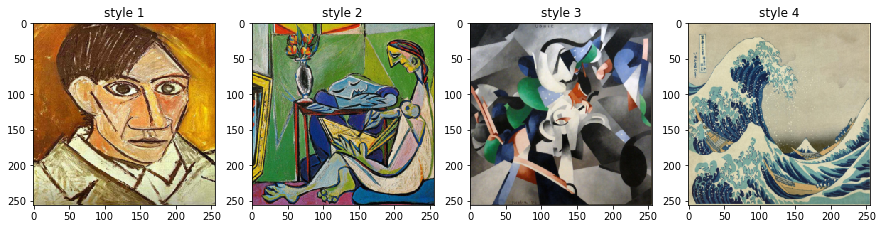

EPOCH : 0, STEP : 0, TIME : 0.0204268
style factor :  [ 0.  0.  0.  1.]
total loss : 1.58203e+07, cont loss : 590880, sty loss : 1.52293e+07


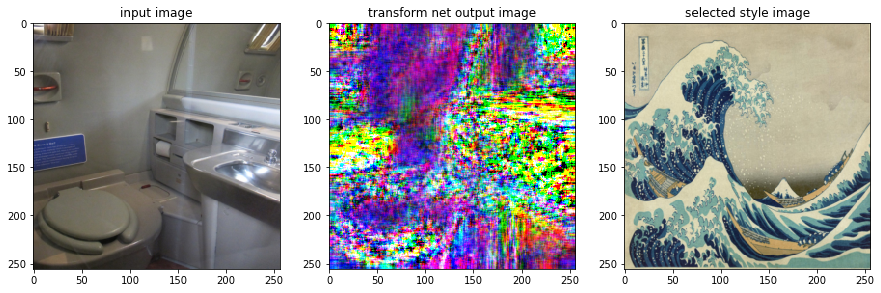

Model saved in file: model.ckpt
EPOCH : 0, STEP : 500, TIME : 700.608
style factor :  [ 0.  0.  0.  1.]
total loss : 170351, cont loss : 95306.1, sty loss : 75011.7


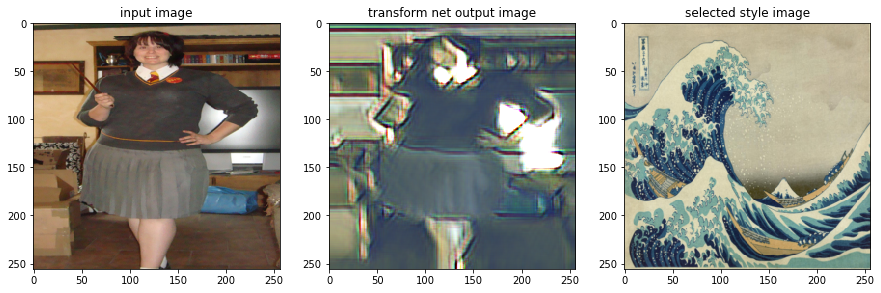

EPOCH : 0, STEP : 1000, TIME : 671.042
style factor :  [ 1.  0.  0.  0.]
total loss : 227257, cont loss : 120834, sty loss : 106382


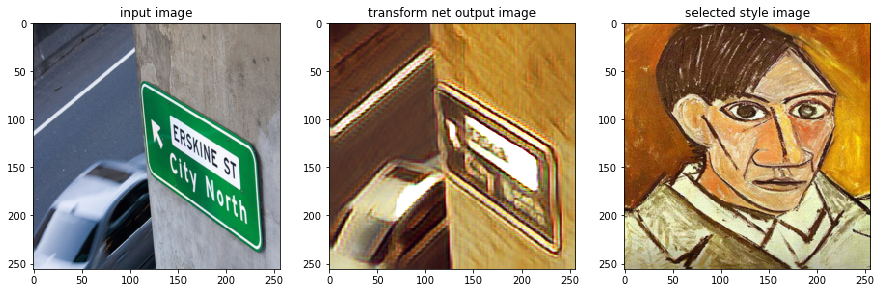

EPOCH : 0, STEP : 1500, TIME : 674.662
style factor :  [ 0.  1.  0.  0.]
total loss : 223766, cont loss : 133300, sty loss : 90415.8


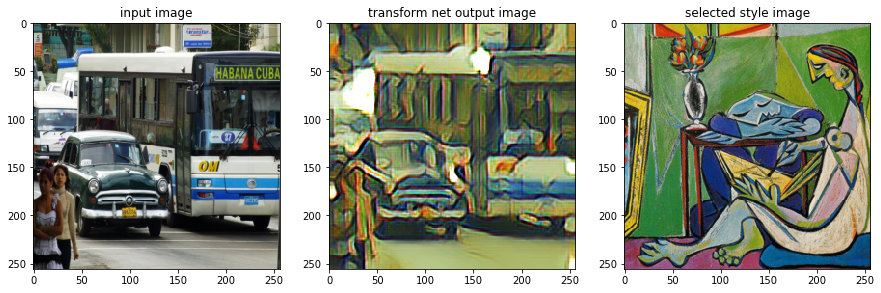

EPOCH : 0, STEP : 2000, TIME : 707.683
style factor :  [ 1.  0.  0.  0.]
total loss : 207716, cont loss : 133643, sty loss : 74030.9


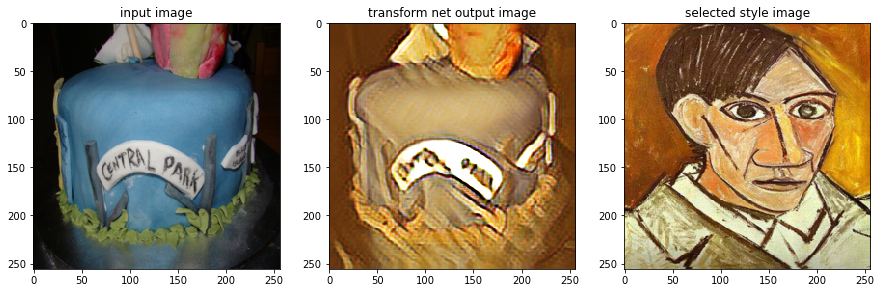

Model saved in file: model.ckpt
EPOCH : 0, STEP : 2500, TIME : 725.817
style factor :  [ 0.  0.  0.  1.]
total loss : 103095, cont loss : 68698.4, sty loss : 34360.5


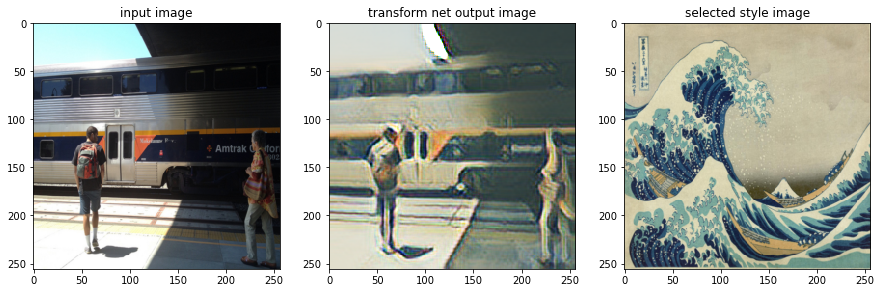

EPOCH : 0, STEP : 3000, TIME : 670.26
style factor :  [ 0.  0.  1.  0.]
total loss : 149708, cont loss : 94932.8, sty loss : 54746.9


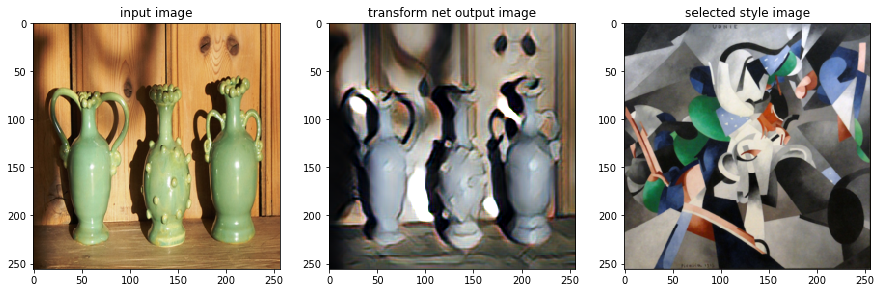

EPOCH : 0, STEP : 3500, TIME : 669.649
style factor :  [ 0.  0.  0.  1.]
total loss : 112275, cont loss : 81384.7, sty loss : 30850.3


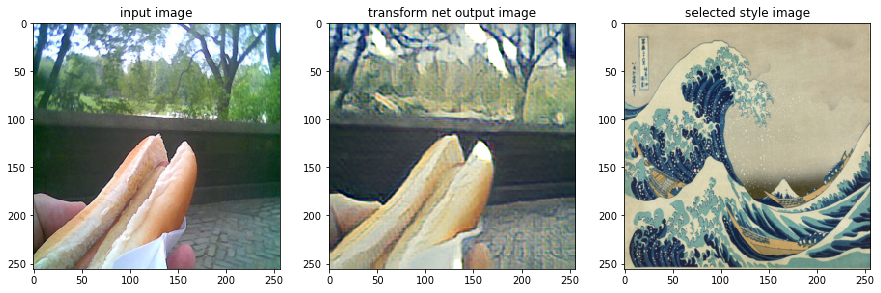

EPOCH : 0, STEP : 4000, TIME : 669.359
style factor :  [ 0.  0.  0.  1.]
total loss : 93339, cont loss : 65730.3, sty loss : 27572.5


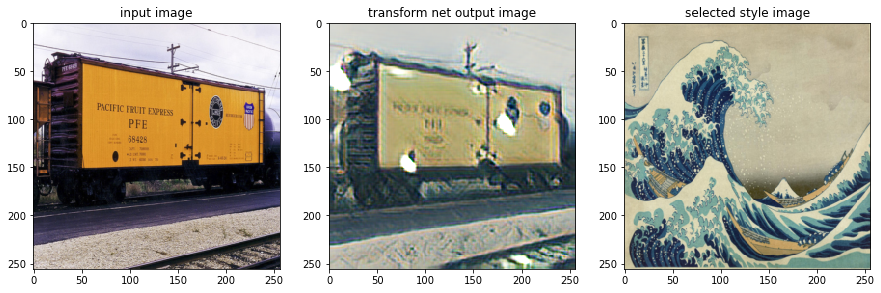

Model saved in file: model.ckpt
EPOCH : 0, STEP : 4500, TIME : 678.399
style factor :  [ 0.  1.  0.  0.]
total loss : 154152, cont loss : 100323, sty loss : 53779.2


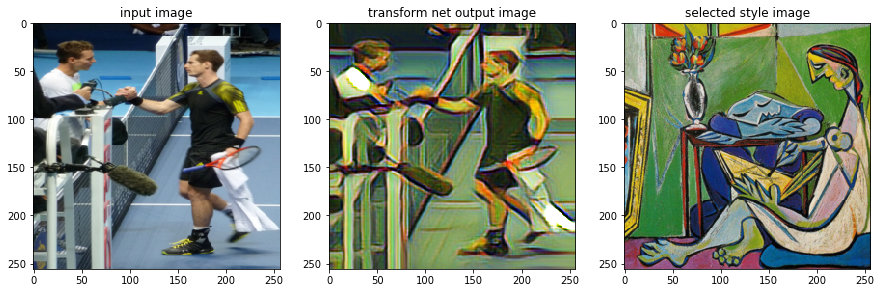

Model saved in file: model.ckpt


In [21]:
# plot style image
plt.figure(figsize=(15,15))
for i in range(STYLE_NUM):
    temp_img = sty_imgs[i,:,:,:]
    temp_img = np.squeeze(temp_img)
    temp_img = visualize_img(temp_img)
    plt.subplot(1,STYLE_NUM,i+1)
    plt.imshow(temp_img)
    plt.title('style '+str(i+1))
plt.show()

# training start
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())
saver = tf.train.Saver()

for epo in range(EPOCH):
    img_list = os.listdir(COCO_PATH)
    img_list = img_list[:DATA_NUM]
    step = 0 
    t1 = time.time()
    while img_list:
        
        # make batch images
        img_names = [img_list.pop() for _ in range(BATCH_SIZE)] # get image names
        batch_imgs = [read_img(COCO_PATH+img_name) for img_name in img_names] # read imges
        batch_imgs = np.stack([batch_imgs[i] for i in range(BATCH_SIZE)]) # stack, list to array :  B, H, W, C
        
        # make style factor
        ind = np.random.randint(0, STYLE_NUM)
        style_factors = np.zeros(shape=[STYLE_NUM, 1])
        style_factors[ind,0] = 1
        
#         factor = np.random.randint(2) 
#         style_factors = np.array([factor,1-factor],dtype=np.float32).reshape(2,1)
#         # test just frist style image
#         style_factors = np.array([1,0],dtype=np.float32).reshape(2,1)
        
            
        
        
        if step % 500 == 0:
            t2 = time.time()
            print('EPOCH : %d, STEP : %d, TIME : %g'%(epo, step, t2-t1))
            print('style factor : ',np.squeeze(style_factors))
            t1 = t2
            tloss,closs,sloss, tout = sess.run([total_loss,cont_loss,sty_loss,transform_out_img], feed_dict={inp_imgs:batch_imgs,sty_factors:style_factors})
            print('total loss : %g, cont loss : %g, sty loss : %g'%(tloss,closs,sloss))
            
            #
            plt.figure(figsize=(15,15))
            in_img = batch_imgs[0,:,:,:]
            in_img = visualize_img(in_img)
            plt.subplot(131)
            plt.title("input image")
            plt.imshow(in_img)
            
            #
            tout = tout[0,:,:,:]
            tout = visualize_img(tout)
            plt.subplot(132)
            plt.title("transform net output image")
            plt.imshow(tout)
            #
            sty_temp = sty_imgs[ind,:,:,:]
            sty_temp = visualize_img(sty_temp)
            plt.subplot(133)
            plt.title('selected style image')
            plt.imshow(sty_temp)
            
            plt.show()
            
        if step % 2000 == 0 :
            save_path = saver.save(sess, 'model.ckpt')
            print("Model saved in file: %s" % save_path)
        step += 1
        sess.run(train_step, feed_dict={inp_imgs: batch_imgs,sty_factors:style_factors})

        
save_path = saver.save(sess, 'model.ckpt')
print("Model saved in file: %s" % save_path)

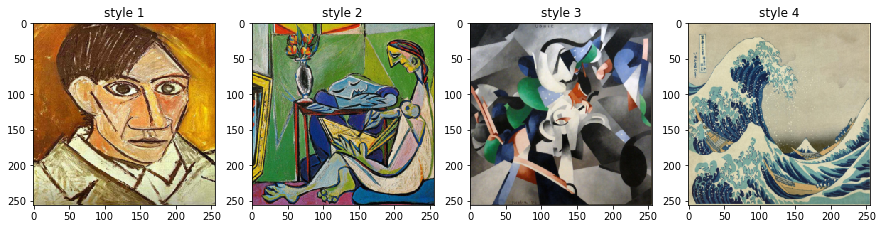

INFO:tensorflow:Restoring parameters from model.ckpt
transfer time :  0.0934899449348


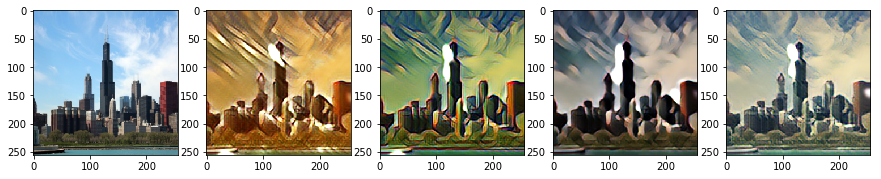

transfer time :  0.0859079957008


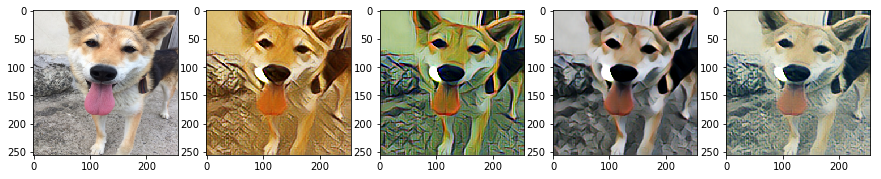

transfer time :  0.08015447855


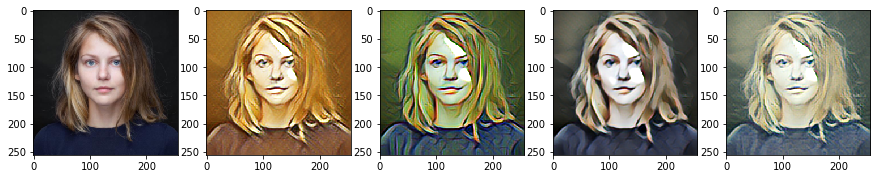

------------------------style change from style 1 to style 3-----------------------------


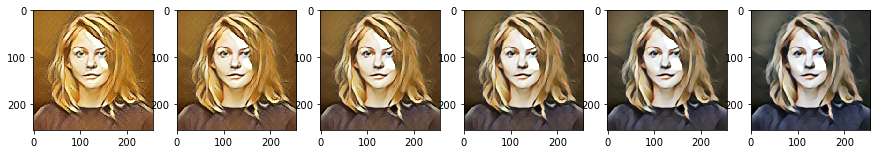

--------------------  style change map  --------------------


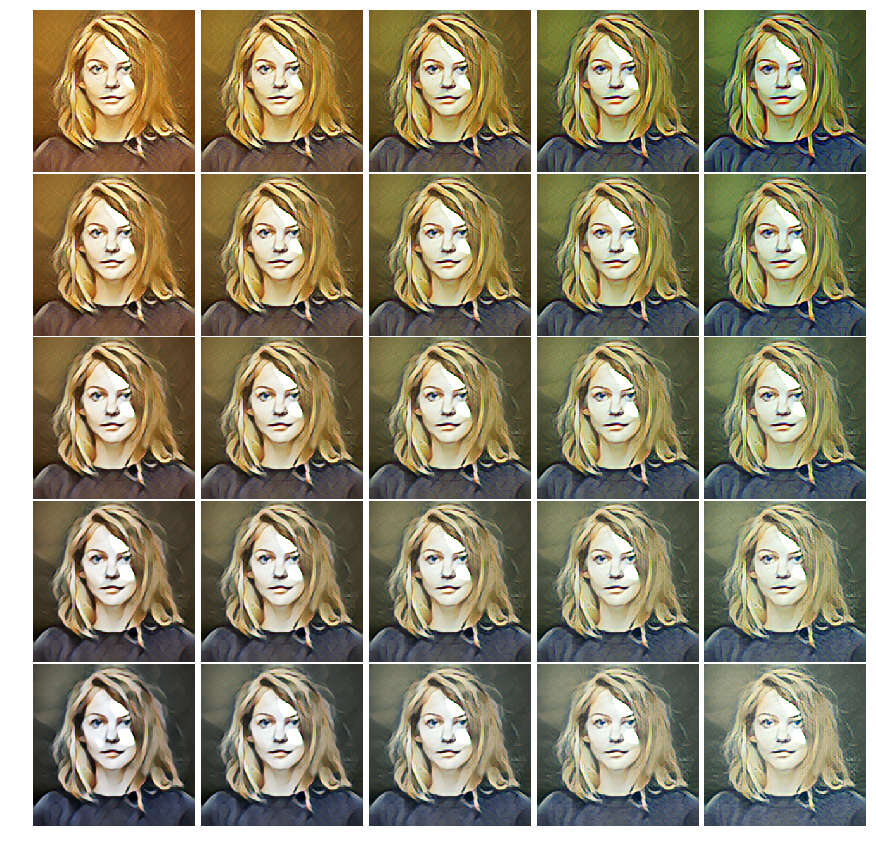

--------------------  style change map, multiply style factor 2 --------------------


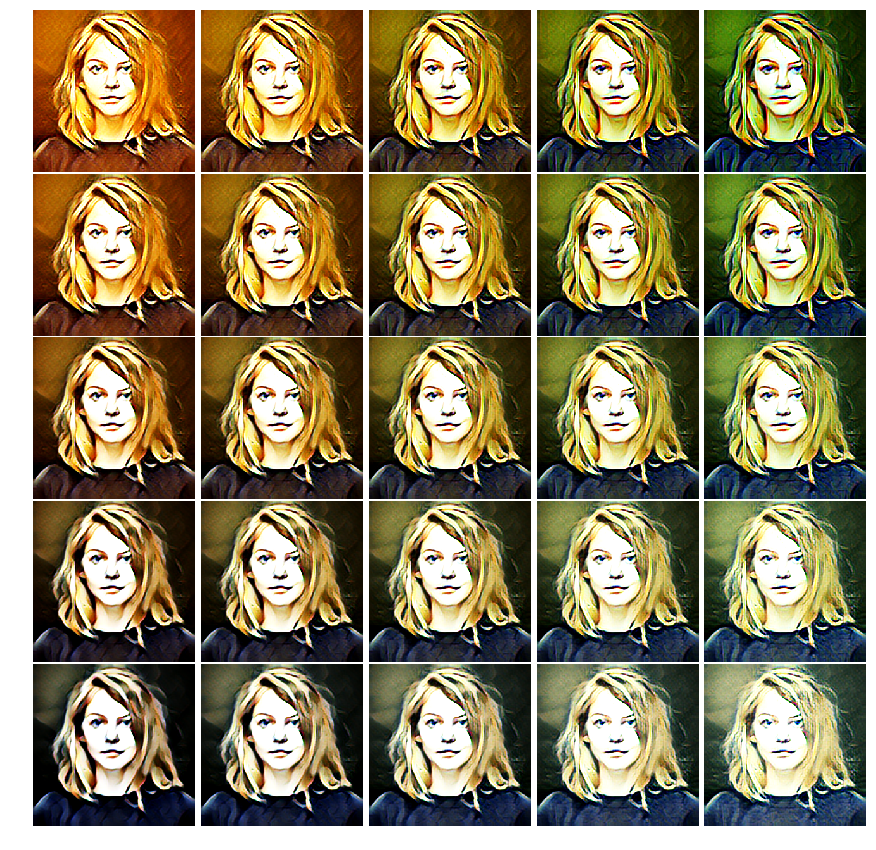

In [49]:
# test_img = read_img('content_image.jpg')
# test_img = np.expand_dims(test_img, axis=0)


# plot style image
plt.figure(figsize=(15,15))
for i in range(STYLE_NUM):
    temp_img = sty_imgs[i,:,:,:]
    temp_img = np.squeeze(temp_img)
    temp_img = visualize_img(temp_img)
    plt.subplot(1,STYLE_NUM,i+1)
    plt.imshow(temp_img)
    plt.title('style '+str(i+1))
plt.show()

# load saved model
with tf.Session() as sess:
    saver = tf.train.Saver()
    saver.restore(sess, 'model.ckpt')
    content_imgs_path = 'content_images'
    content_img_lst = os.listdir(content_imgs_path)
    for img_name in content_img_lst:
        img_name = content_imgs_path+'/'+img_name
        test_img = read_img(img_name)
        test_img = np.expand_dims(test_img, axis=0)
        factor_lst = [[1,0,0,0], [0,1,0,0], [0,0,1,0], [0,0,0,1] ]
        time_lst = list()

        # image
        plt.figure(figsize=(15,15))
        plt.subplot(1,5,1)
        plt.imshow(np.squeeze(test_img))
        for i, factors in enumerate(factor_lst):
            test_factor = np.array(factors)
            test_factor = test_factor.reshape(4,1)
            t1 = time.time()
            test_out = sess.run(transform_out_img, feed_dict={inp_imgs: test_img,sty_factors:test_factor})
            t2 = time.time()
            time_lst.append(t2-t1)

            plt.subplot(1,5,i+2)
            test_out = visualize_img(test_out[0,:,:,:])
            plt.imshow(test_out)

        print('transfer time : ',np.mean(time_lst))
        plt.show()
    print('------------------------style change from style 1 to style 3-----------------------------')
    factor_lst = [ [1,0,0,0], [0.8,0,0.2,0], [0.6,0,0.4,0], [0.4,0,0.6,0],[0.2,0,0.8,0], [0,0,1,0]]
    karya_img = read_img(content_imgs_path+'/'+'karya.jpg')
    karya_img = np.expand_dims(karya_img, axis=0)
    plt.figure(figsize=(15,15))
    for i, factor in enumerate(factor_lst):
        test_factor = np.array(factor).reshape(4,1)
        test_out = sess.run(transform_out_img, feed_dict={inp_imgs:karya_img, sty_factors:test_factor})
        plt.subplot(1,6,i+1)
        plt.imshow(visualize_img(test_out[0,:,:,:]))
    plt.show()
    print('-'*20,' style change map ','-'*20)
    a,b,c,d,e,f,g,h,i,j = 1, 0.75, 0.5, 0.25, 0, 0.5625, 0.375, 0.125, 0.1875, 0.0625
    lst = [ [a,e,e,e],[b,d,e,e],[c,c,e,e],[d,b,e,e],[e,a,e,e],
        [b,e,d,e],[f,i,i,j],[g,g,h,h],[i,f,j,i],[e,b,e,d],
        [c,e,c,e],[g,h,g,h],[d,d,d,d],[h,g,h,g],[e,c,e,c],
        [d,e,b,e],[i,j,f,i],[h,h,g,g],[j,i,i,f],[e,d,e,b],
        [e,e,a,e],[e,e,b,d],[e,e,c,c],[e,e,d,b],[e,e,e,a]
        ]
    plt.figure(figsize=(15,15))
    for i,factor in enumerate(lst):
        test_factor = np.array(factor).reshape(4,1)
        test_factor = test_factor
        test_out = sess.run(transform_out_img, feed_dict={inp_imgs:karya_img, sty_factors:test_factor})
        plt.subplot(5,5,i+1)
        plt.axis('off')
        plt.imshow(visualize_img(test_out[0,:,:,:]))
    plt.subplots_adjust(wspace=1e-2, hspace=1e-2)
    plt.show()
    print('-'*20,' style change map, multiply style factor 2','-'*20)
    plt.figure(figsize=(15,15))
    for i,factor in enumerate(lst):
        test_factor = np.array(factor).reshape(4,1)
        test_factor = test_factor*2
        test_out = sess.run(transform_out_img, feed_dict={inp_imgs:karya_img, sty_factors:test_factor})
        plt.subplot(5,5,i+1)
        plt.axis('off')
        plt.imshow(visualize_img(test_out[0,:,:,:]))
    plt.subplots_adjust(wspace=1e-2, hspace=1e-2)
    plt.show()